**Predmet**: Principi prezentacije i prepoznavanja oblika

**Student**: Andreja Vuković

**Broj** **indeksa**: IT64/2019

**Projektni zadatak**: Klasifikacija - LEGO

---



# **UVOD**

**Mašinsko učenje** je podskup vještačke inteligencije koja omogućava računarima da uče i da se usavršavaju iz iskustva bez eksplicitnog programiranja. Za razliku od tradicionalnog programiranja, gdje programer piše kod za obavljanje određenog zadatka, u mašinskom učenju sistem koristi statističke algoritme za analizu podataka i poboljšanje performansi tokom vremena. Algoritmi mašinskog učenja mogu da identifikuju obrasce i odnose u podacima, da predviđaju i donose odluke na osnovu tih podatka.
Postoje četiri tipa zadataka mašinskog učenja:


1.   Učenje pod nadzorom,
2.   Učenje bez nadzora,
3.   Polu-nadgledano učenje i
4.   Učenje sa pojačanjem.



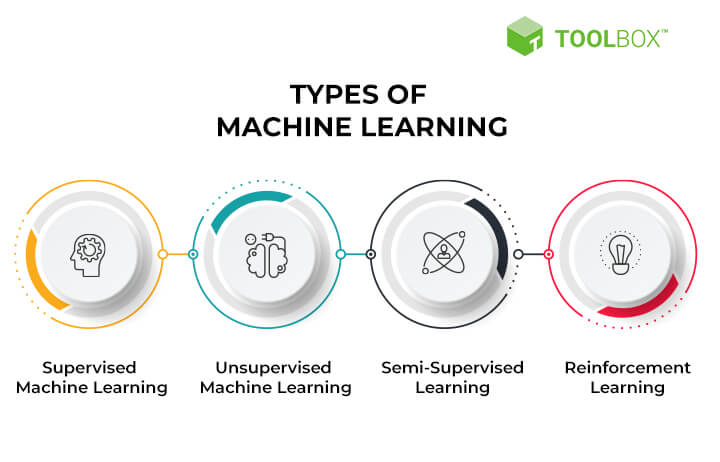

**Učenje pod nadozorom** (engl. *Supervised Machine Learning*) je jedna od najšire praktikovanih grana mašinskog učenja koja koristi označene podatke o treningu kako bi pomogla modelima da prave tačna predviđanja.

Učenje pod nadzorom je dobro u problemima klasifikacije i regresije, kao što je određivanje kojoj kaTegoriji novinski članak pripada ili predviđanje obima prodaje za određeni budući datum.

Organizacije mogu da koriste učenje pod nadzorom u procesima kao što su otkrivanje anomalija, otkirvanje prevare, klasifikacija slika, procjena razlika i filtriraje nepoželjne pošte.

Kao i svi algoritmi za mašinsko učenje, nadgledano učenje se zasniva na obuci. Tokom faze obuke, sistem se napaja sa označenim skupom podataka, koji upućuju sistemu koja je izlazna varijabla povezana sa svakom određenom ulaznom vrijednošću. Obučeni mode se zatim predstavlja sa podacima testa. Ovo su podaci koji su označeni, ali iznake nisu otrkivene algoritmu. Cilj podataka testiranja je da se izmjeri koliko tačno algoritam radi na neoznačenim podacima.



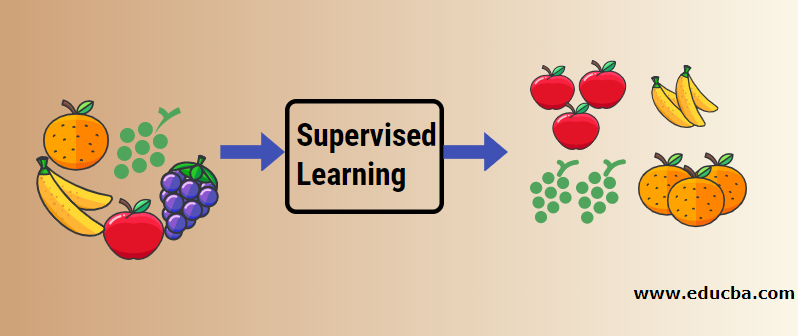

**Klasifikacija** se definiše kao proces prepoznavanja, razumijevanja i grupisanja objekata i ideja u unaprijed postavljene kategorije koje se nazivaju "podpopulacije". Uz pomoć ovih unaprijed kategorisanih skupova podataka za obuku, klasifikacija u programima mašinskog učenja koristi širok spektar algoritama za klasifikaciju budućih skupova podataka u odgovarajuće relevantne kategorije.
Glavna razlika između modela regresije i klasifikacionih modela je u tome što se regresioni modeli koriste za predviđanje kontinuiranih vrijednosti (rezultati testa) dok klasifikacioni algoritmi predviđaju diskretne vrijednosti (muško/žensko, tačno/netačno, sunce/kiša).

Cilj projektnog zadatka je da se izvrši klasifikacija Lego figura, odnosno potrebno je da se odredi kojoj klasi pripadadaju figure iz datog seta podataka. Za izradu zadatka korišćene su unaprijed istrenirane neuronske mreže *DenseNet121* i *ResNet50*, kako bi se figure iz seta podataka uspješno klasifikovale.

# **BIBLIOTEKE**








**1. NumPy** je osnovni paket za naučno računarstvo u Python-u. To je *Python* biblioteka koja obezbjeđuje višedimenzionalni niz objekata, različite izvedene objekte (kao što su maskirani nizovi i matrice) i niz rutina za brze operacije na nizovima, uključujući matematičku, logičku, manipulaciju oblika, sortiranje, selekciju, I/O, diskretne Furijeove transformacije, osnovna linearna algebra, osnovne statističke operacije, simulacije nasumičnih brojeva i mnogo više.

**2. Pandas** je *Python* paket koji obezbjeđuje brze, fleksibilne i izražajne strukture podataka dizajnirane da rad sa "relacionim" ili "označenim" podacima učine lakim i intuitivnim. Cilj mu je da bude osnovni gradivnim blok visokog nivoa za praktičnu analizu stvarnih podataka u *Python*-u. Dodatno, ima širi cilj da postane najmoćniji i najfleksibilniji alat za analizu/manipulaciju podataka otvorenog koda dostupan na bilo kom jeziku.

**3. Seaborn** je biblioteka za pravljenje statističkih grafikona u Python-u. Ona se zasniva na biblioteci *matplotlib* i integriše sa *pandas* strukturama podataka. *Seaborn* pomaže u istraživanju i razumijevanju podatka. Njegove funkcije za iscrtavanje rade sa dataframovima i nizovima koji sadrže kompletne skupove podataka i interno obavljaju neophodno semantičko mapiranje i statističku agregaciju kako bi proizveli informativne dijagrame. Njegov deklarativni API orijentisan na skup podataka omogućava da se fokus stavi na to šta znače različiti elementi dijagrama, a ne na detalje kako ih nacrtati.

**4. TensorFlow** je biblioteka otvorenog koda za brzo numeričko računanje. Kreirano ga je i održava *Google*, a objavljena je pod licencom *Apache* 2.0 otvorenog koda. API je nominalno za programski jezik *Python*, iako postoji pristup osnovnom C++ API-ju. Za razliku od drugih numeričkih biblioteka koje su namenjene za upotrebu u dubokom učenju, kao što je *Theano*, *TensorFlow* je dizajniran za korišćenje kako u istraživanju i razvoju, tako i u proizvodnim sistemima, od kojih je jedan *RankBrain* u *Google* pretrazi i zabavan projekat *DeepDream*. On može da se izvršava na jednostrukim CPU sistemima i grafičkim procesorima (GPU-ima), kao i na mobilnim uređajima i distribuiranim sistemima sa stotinama mašina.

**5. Matplotlib** je višeplatformska biblioteka za vizualizaciju podataka i grafičko crtanje (histogrami, raspoređeni grafikoni, stubičasti dijagrami, itd.) za *Python* i njegovo numeričko proširenje *NumPy*. Kao takva, ona predstavlja  open-source alternativu za *MATLAB*. Programeri takođe mogu koristiti *matplotlib*-ove API-je (aplikacioni programerski interfejs) kako bi ugradili dijagrame u GUI aplikacije.


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import cv2

import tensorflow as tf
from tensorflow.keras.applications import mobilenet_v2 as tf_mobilenet_v2
from tensorflow.keras import layers,models
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Flatten, Dropout, Dense
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# **UČITAVANJE I ANALIZA SETA PODATAKA**

Set podataka se sastoji od 5 foldera, a to su:


1.   marvel,
2.   harry-potter,
3.   star-wars,
4.   jurassic-world i
5.   test

Pored toga, u okviru seta podataka postoje i *CSV* fajlovi na osnovu kojih se može zaključiti koji slike se koriste kao trening, a koje kao test podaci.

U narednoj ćeliji izvršeno je preuzimanje i učitavanje seta podataka, koji se nalazi na *Google Drive*-u.






In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1C40v-MMPUYKINKRtSlEwtFfjijwEc4Zl' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1C40v-MMPUYKINKRtSlEwtFfjijwEc4Zl" -O data.zip && rm -rf /tmp/cookies.txt



--2023-08-04 09:15:09--  https://docs.google.com/uc?export=download&confirm=t&id=1C40v-MMPUYKINKRtSlEwtFfjijwEc4Zl
Resolving docs.google.com (docs.google.com)... 172.253.122.101, 172.253.122.138, 172.253.122.102, ...
Connecting to docs.google.com (docs.google.com)|172.253.122.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a8b0mfquv2tl7qhhi38smgba1uetsv16/1691140500000/06145252528509741365/*/1C40v-MMPUYKINKRtSlEwtFfjijwEc4Zl?e=download&uuid=5cb5ed54-fb35-4d3c-9f5b-8bd9b84ab790 [following]
--2023-08-04 09:15:09--  https://doc-0s-70-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a8b0mfquv2tl7qhhi38smgba1uetsv16/1691140500000/06145252528509741365/*/1C40v-MMPUYKINKRtSlEwtFfjijwEc4Zl?e=download&uuid=5cb5ed54-fb35-4d3c-9f5b-8bd9b84ab790
Resolving doc-0s-70-docs.googleusercontent.com (doc-0s-70-docs.googleusercontent.com)... 172.253.62.1

Komanda *!unzip data.zip* se koristi za raspakivanje (dekompresiju) arive koja je sačuvana u fajlu *data.zip*. Svi fajlovi i direktorijumi koji se nalaze unutar arhive biće izvučeni i smješteni u odgovarajući direktorijum na računaru. Ovo omogućava pristup sadržaju koji se nalazi unutar arhive i dalje korišćenje tih podataka za obradu, analizu, treniranje modela itd.

In [ ]:
!unzip data.zip

Archive:  data.zip
  inflating: LICENSE                 
  inflating: harry-potter/0001/001.jpg  
  inflating: harry-potter/0001/002.jpg  
  inflating: harry-potter/0001/003.jpg  
  inflating: harry-potter/0001/004.jpg  
  inflating: harry-potter/0001/005.jpg  
  inflating: harry-potter/0001/006.jpg  
  inflating: harry-potter/0001/007.jpg  
  inflating: harry-potter/0001/008.jpg  
  inflating: harry-potter/0001/009.jpg  
  inflating: harry-potter/0001/010.jpg  
  inflating: harry-potter/0001/011.jpg  
  inflating: harry-potter/0001/012.jpg  
  inflating: harry-potter/0001/013.jpg  
  inflating: harry-potter/0002/001.jpg  
  inflating: harry-potter/0002/002.jpg  
  inflating: harry-potter/0002/003.jpg  
  inflating: harry-potter/0002/004.jpg  
  inflating: harry-potter/0002/005.jpg  
  inflating: harry-potter/0002/006.jpg  
  inflating: harry-potter/0002/007.jpg  
  inflating: harry-potter/0002/008.jpg  
  inflating: harry-potter/0002/009.jpg  
  inflating: harry-potter/0002/010.jpg  


Vrši se učitavanje i prikaz slika iz tri različita direktorijuma (harry-potter, star-wars i marvel). Ova vrsta prikaza slika je korisna radi vršenja provjere uspješnosti preuzetih izvornih podataka.

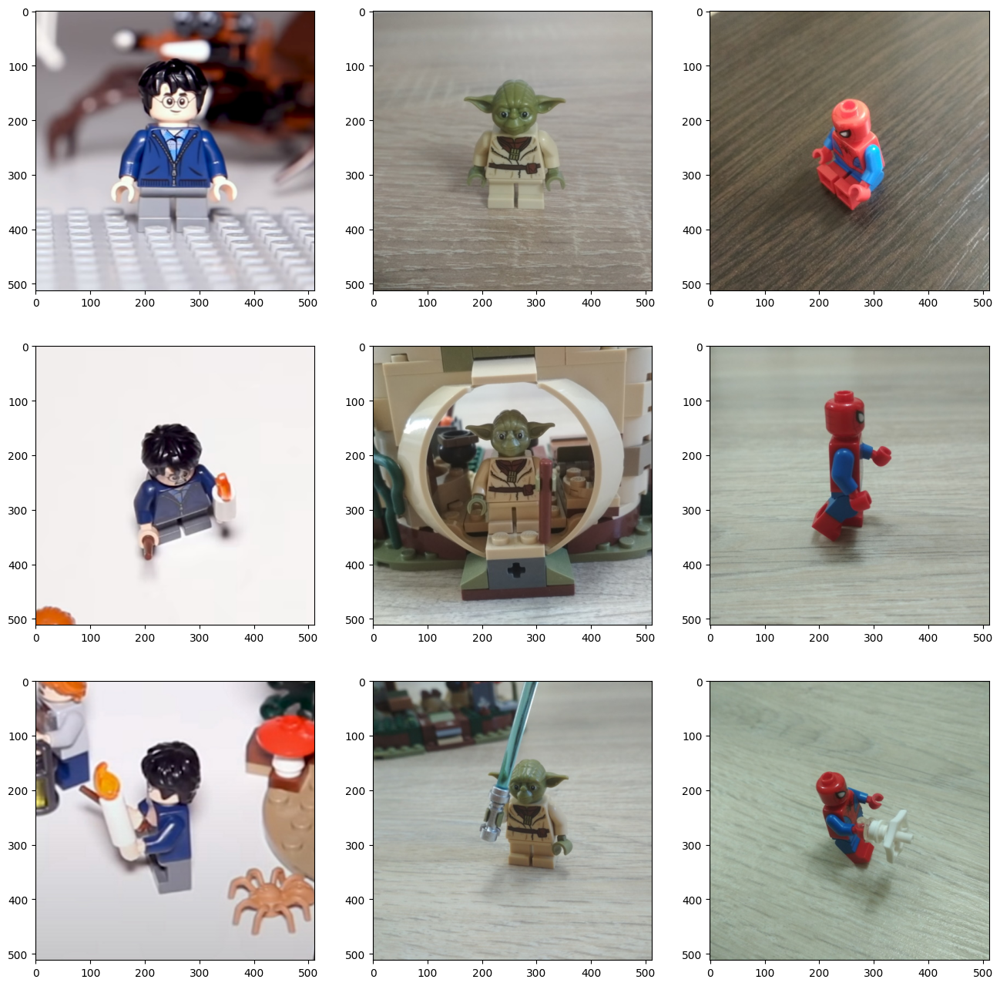

In [ ]:
images = [[], [], []]
index = ['002', '005', '007']

for i in range(3):
  images[i].append(mpimg.imread('harry-potter/0001/' + index[i] + '.jpg'))
  images[i].append(mpimg.imread('star-wars/0001/' + index[i] + '.jpg'))
  images[i].append(mpimg.imread('marvel/0001/' + index[i] + '.jpg'))

fig, axs = plt.subplots(3, 3, figsize=(16,16))

for i  in range(3):
  for j in range(3):
    axs[i, j].imshow(images[i][j])

Zatim se provjeravaju dimenije slike kako bi se osiguralo da je slika ispravno učitana i spremna za dalju obradu.

In [ ]:
image = load_img("harry-potter/0001/003.jpg")
x = img_to_array(image)
print(x.shape)

(512, 512, 3)


Učitavaju se podaci iz *index.csv* fajla i smještaju se u *DataFrame*, kako bi se mogle izvršiti različite analize, prikazi dijelova tabela i druge operacije.


In [ ]:
index_df = pd.read_csv('index.csv')
index_df

,path,class_id
0,marvel/0001/001.jpg,1
1,marvel/0001/002.jpg,1
2,marvel/0001/003.jpg,1
3,marvel/0001/004.jpg,1
4,marvel/0001/005.jpg,1
...,...,...
366,star-wars/0017/006.jpg,38
367,star-wars/0017/007.jpg,38
368,star-wars/0017/008.jpg,38
369,star-wars/0017/009.jpg,38


Na sličan način se izvršava učitavanje *metadata.csv* fajla gdje se nalaze nazivi figura određene numeričke oznake.

In [ ]:
metadata_df = pd.read_csv('metadata.csv', encoding='unicode_escape')
metadata_df

,class_id,lego_ids,lego_names,minifigure_name
0,1,[76115],['Spider Mech vs. Venom'],SPIDER-MAN
1,2,[76115],['Spider Mech vs. Venom'],VENOM
2,3,[76115],['Spider Mech vs. Venom'],AUNT MAY
3,4,[76115],['Spider Mech vs. Venom'],GHOST SPIDER
4,5,[75208],"[""Yoda's Hut""]",YODA
5,6,[75208],"[""Yoda's Hut""]",LUKE SKYWALKER
6,7,[75208],"[""Yoda's Hut""]",R2-D2
7,8,[75199],"[""General Grievous' Combat Speeder""]",MACE WINDU
8,9,[75199],"[""General Grievous' Combat Speeder""]",GENERAL GRIEVOUS
9,10,[75264],"[""Kylo Ren's Shuttle Microfighter""]",KYLO REN


Nakon učitavanja podataka iz fajlova *index.csv* i *metadata.csv*, vrši se njihovo spajanje na osnovu zajedničke kolone *class_id* kako bi se dobile informacije o indeksima slika i imenima minifigura.

In [ ]:
data_df = pd.merge(index_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
data_df

,path,class_id,minifigure_name
0,marvel/0001/001.jpg,1,SPIDER-MAN
1,marvel/0001/002.jpg,1,SPIDER-MAN
2,marvel/0001/003.jpg,1,SPIDER-MAN
3,marvel/0001/004.jpg,1,SPIDER-MAN
4,marvel/0001/005.jpg,1,SPIDER-MAN
...,...,...,...
366,star-wars/0017/006.jpg,38,BOBA FETT
367,star-wars/0017/007.jpg,38,BOBA FETT
368,star-wars/0017/008.jpg,38,BOBA FETT
369,star-wars/0017/009.jpg,38,BOBA FETT


In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 371 entries, 0 to 370
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   path             371 non-null    object
 1   class_id         371 non-null    int64 
 2   minifigure_name  371 non-null    object
dtypes: int64(1), object(2)
memory usage: 11.6+ KB


Prikaz slika sa njihovim odgovarajućim imenima minifigura koje su izabrane nasumično.


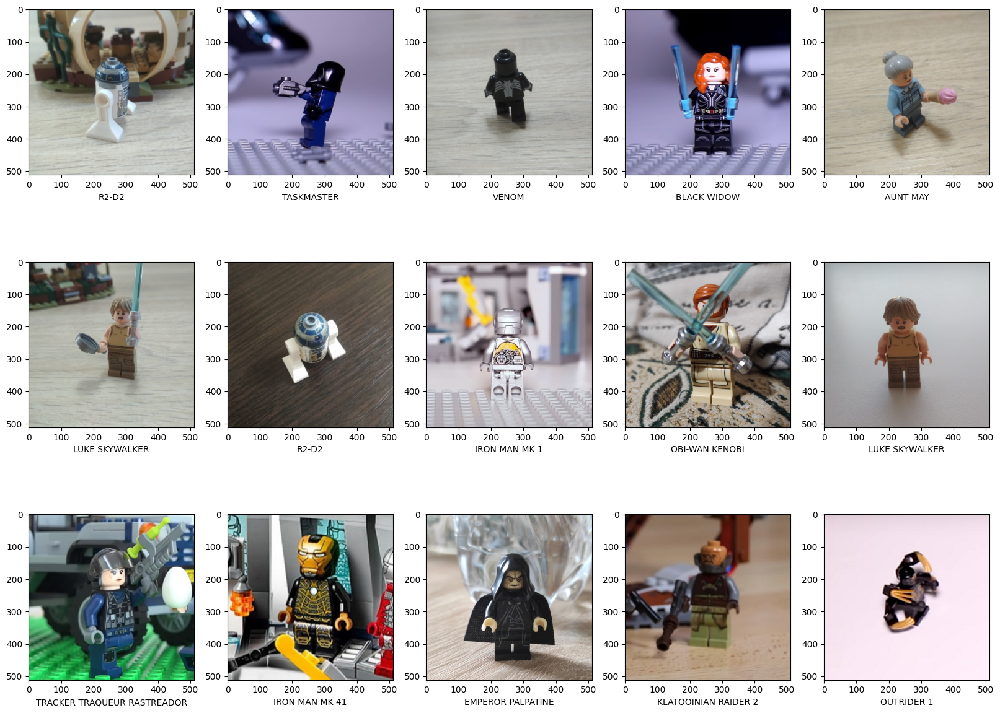

In [ ]:
sample_df = data_df.sample(15)

plt.figure(figsize=(20,15))
i=0
for i in range(15):
  plt.subplot(3,5,i+1)
  plt.grid(False)
  img = load_img(sample_df['path'].values[i])
  plt.imshow(img)
  plt.xlabel(sample_df['minifigure_name'].values[i])
  i += 1

plt.show()

Pomoću horizontalnog trakastog dijagrama prikazana su imena minifigura, kao i broj pojavljivanja svake minifigure.


In [ ]:
import plotly.graph_objects as go
df_count = data_df['minifigure_name'].value_counts().to_frame().reset_index().rename(columns={'index': 'minifigure_name', 'minifigure_name': 'Count'})

fig = go.Figure(go.Bar(
    x = df_count['minifigure_name'], y = df_count['Count'],
    marker = {'color' : df_count['Count'], 'colorscale': 'ylgnbu'},
    text = df_count['Count'],
    textposition = "outside",
))

fig.update_layout(title_text='Number of minifigures', xaxis_title = "Minifigure name", yaxis_title="Number", title_x=0.5)
fig.show()

# **PODJELA PODATAKA NA PODATKE ZA TRENING, VALIDACIJU I TEST**







Nakon upoznavanja i analize datog seta podataka, vrši se podjela podataka na podatke za trening i validacione podatke. Učitavaju se podaci iz *CSV* fajla *test.csv*. Metoda *drop* se koristi za brisanje određenih kolona, u ovom slučaju briše se kolona *class_id*, dok će *X_test* sadržati sve ostale kolone iz fajla. *X_test* predstavlja tabelu sa svim ulaznim karakteristikama (atributima) iz testnog skupa podataka.

In [ ]:
test_df = pd.read_csv('test.csv')
X_test = test_df.drop(columns = ['class_id'])
X_test

,path
0,test/001.jpg
1,test/002.jpg
2,test/003.jpg
3,test/004.jpg
4,test/005.jpg
...,...
74,test/075.jpg
75,test/076.jpg
76,test/077.jpg
77,test/078.jpg


Promjenljiva *Y_test* će sadržati sve oznake klasa za svaki uzrok u testnom skupu podataka.

In [ ]:
Y_test = test_df['class_id']
Y_test

0     32
1     32
2     32
3     32
4      1
      ..
74    37
75    37
76    38
77    38
78    38
Name: class_id, Length: 79, dtype: int64

U nastavku je izvršeno spajanje *test_df* i *metadata_df* po obilježju *class_id*, kao i sortiranje po obilježju *path*.

In [ ]:
test_actual_df = pd.merge(test_df, metadata_df[['class_id', 'minifigure_name']], on='class_id')
test_actual_df.sort_values('path')

,path,class_id,minifigure_name
0,test/001.jpg,32,JANNAH
1,test/002.jpg,32,JANNAH
2,test/003.jpg,32,JANNAH
3,test/004.jpg,32,JANNAH
4,test/005.jpg,1,SPIDER-MAN
...,...,...,...
74,test/075.jpg,37,OBI-WAN KENOBI
75,test/076.jpg,37,OBI-WAN KENOBI
76,test/077.jpg,38,BOBA FETT
77,test/078.jpg,38,BOBA FETT


U ovom dijelu se vrši kreiranje promjenjive *X_data* sa ulaznim karakteristikama (atributima) za anlizu, kao i brisanje kolone *class_id*.

In [ ]:
X_data = data_df.drop(columns = ['class_id'])
X_data

,path,minifigure_name
0,marvel/0001/001.jpg,SPIDER-MAN
1,marvel/0001/002.jpg,SPIDER-MAN
2,marvel/0001/003.jpg,SPIDER-MAN
3,marvel/0001/004.jpg,SPIDER-MAN
4,marvel/0001/005.jpg,SPIDER-MAN
...,...,...
366,star-wars/0017/006.jpg,BOBA FETT
367,star-wars/0017/007.jpg,BOBA FETT
368,star-wars/0017/008.jpg,BOBA FETT
369,star-wars/0017/009.jpg,BOBA FETT


Zatim se kreira promjenljiva *Y_data* koja predstavlja ciljnu promjenljivu ili oznake za analizu.

In [ ]:
Y_data = data_df['class_id']
Y_data

0       1
1       1
2       1
3       1
4       1
       ..
366    38
367    38
368    38
369    38
370    38
Name: class_id, Length: 371, dtype: int64

Vrši se provjera ukupnog broja uzoraka koji se nalaze u skupu podataka.

In [ ]:
len(data_df)

371

Vrši se provjera ukupnog broja uzoraka koji se nalaze u testnom skupu podataka.

In [ ]:
len(test_df)

79

Koristi se funkcija train_test_split kako bi se podijelio skup podataka na trening i validacioni skup. Skup podataka *X_data* i *Y_data* na četiri dijela: *X_train*, *X_val*, *Y_train* i *Y_val*. Parametar test_size određuje da će 20% podataka biti rezervisano za validacioni skup, dok će preostalih 80% biti korišćeno za trening skup.

In [ ]:
X_train, X_val, Y_train, Y_val = train_test_split(X_data, Y_data, test_size=0.20, random_state=8)

Podaci se pripremaju za trening modela konverzijom slika u odgovarajući format i obradom ciljnih oznaka. Pravi se *numpy* niz *X_train_converted* dimenzija (broj uzoraka, 224, 224, 3), gdje se svaka slika konvertuje u formatu dimnezija 224x224x3.

In [ ]:
X_train_converted = np.zeros((X_train.shape[0], 224, 224, 3))

for i in range(X_train.shape[0]):
  image = cv2.imread(X_train["path"].values[i])
  image = cv2.resize(image, dsize=(224, 224))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  X_train_converted[i] = image/255

Y_train_converted = np.array(Y_train)-1

Ovaj dio predstavlja prvi uzorak (sliku) u *numpy* nizu.


In [ ]:
X_train_converted[0]

array([[[0.69803922, 0.68627451, 0.66666667],
        [0.69411765, 0.68235294, 0.6627451 ],
        [0.69411765, 0.68235294, 0.65490196],
        ...,
        [0.59215686, 0.54509804, 0.49019608],
        [0.59607843, 0.54901961, 0.49411765],
        [0.59215686, 0.54509804, 0.49019608]],

       [[0.68627451, 0.6745098 , 0.65490196],
        [0.68627451, 0.6745098 , 0.64705882],
        [0.68235294, 0.67058824, 0.64313725],
        ...,
        [0.60392157, 0.55686275, 0.50196078],
        [0.60392157, 0.55686275, 0.50196078],
        [0.59607843, 0.54901961, 0.49411765]],

       [[0.67843137, 0.6627451 , 0.63921569],
        [0.67843137, 0.6627451 , 0.63921569],
        [0.6745098 , 0.65490196, 0.63137255],
        ...,
        [0.6       , 0.55294118, 0.49803922],
        [0.60392157, 0.55686275, 0.50196078],
        [0.6       , 0.55294118, 0.49803922]],

       ...,

       [[0.58431373, 0.55686275, 0.52156863],
        [0.66666667, 0.63529412, 0.61176471],
        [0.63529412, 0

Podaci iz validacionog skupa se pripremaju za evaluaciju modela na sličan način kao što je to urađeno za trening skup podataka. Kao i ranije, slike se konvertuju u odgovarajući format, a ciljne oznake se prilagode za evaluaciju.

In [ ]:
X_val_converted = np.zeros((X_val.shape[0], 224, 224, 3))

for i in range(X_val.shape[0]):
  image = cv2.imread(X_val["path"].values[i])
  image = cv2.resize(image, dsize=(224, 224))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  X_val_converted[i] = image/255

Y_val_converted = np.array(Y_val)-1

In [ ]:
X_val_converted[0]

array([[[0.37254902, 0.34117647, 0.2745098 ],
        [0.38823529, 0.34901961, 0.28235294],
        [0.38431373, 0.34901961, 0.28235294],
        ...,
        [0.56078431, 0.54901961, 0.48235294],
        [0.56470588, 0.54901961, 0.48235294],
        [0.55686275, 0.54509804, 0.47843137]],

       [[0.39215686, 0.36470588, 0.29411765],
        [0.41176471, 0.38431373, 0.31372549],
        [0.41176471, 0.37647059, 0.30980392],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.57254902, 0.56078431, 0.49411765],
        [0.56862745, 0.55686275, 0.49019608]],

       [[0.41960784, 0.39215686, 0.32156863],
        [0.41176471, 0.38431373, 0.31372549],
        [0.40392157, 0.37647059, 0.30588235],
        ...,
        [0.56470588, 0.55294118, 0.48627451],
        [0.58039216, 0.56862745, 0.50196078],
        [0.56862745, 0.55686275, 0.49019608]],

       ...,

       [[0.30980392, 0.27058824, 0.23529412],
        [0.3372549 , 0.29803922, 0.2627451 ],
        [0.31372549, 0

Takođe, podaci iz testnog skupa se priremaju za evaluaciju modela. Slično kao u prethodnim dijelovima koda, slike se konvertuju u odgovarajući format, a ciljne oznake ostaju nepromjenjene jer u testnom skupu nemamo potrebu za modifikacijom ciljnih oznaka.

In [ ]:
X_test_converted = np.zeros((X_test.shape[0], 224, 224, 3))

for i in range(X_test.shape[0]-1):
  image = cv2.imread(X_test["path"].values[i])
  image = cv2.resize(image, dsize=(224, 224))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  X_test_converted[i] = image/255

Y_test_converted = np.array(Y_test)

# **DenseNet121**

Konvoluciona neuronska mreža (engl. *Convolutional neural network - CNN*) je korisna za klasifikaciju slika.

*DenseNet* je gusto povezana konvoluciona mreža. Veoma je slična ResNet sa nekim fundamentalnim razlikama. *ResNet* koristi aditivni metod što znači da uzimaju prethodni izlaz kao ulaz za budući sloj, a u DenseNet uzima sav prethodni izlaz kao ulaz za budući sloj. Dakle, DenseNet je specijalno razvijen da poboljša tačnost uzrokovanu nestajanjem gradijenta u neuronskim mrežama visokog nivoa zbog velike udaljenosti između ulaznih i izlaznih slojeva i informacije nastaju prije nego što stignu na odredište.


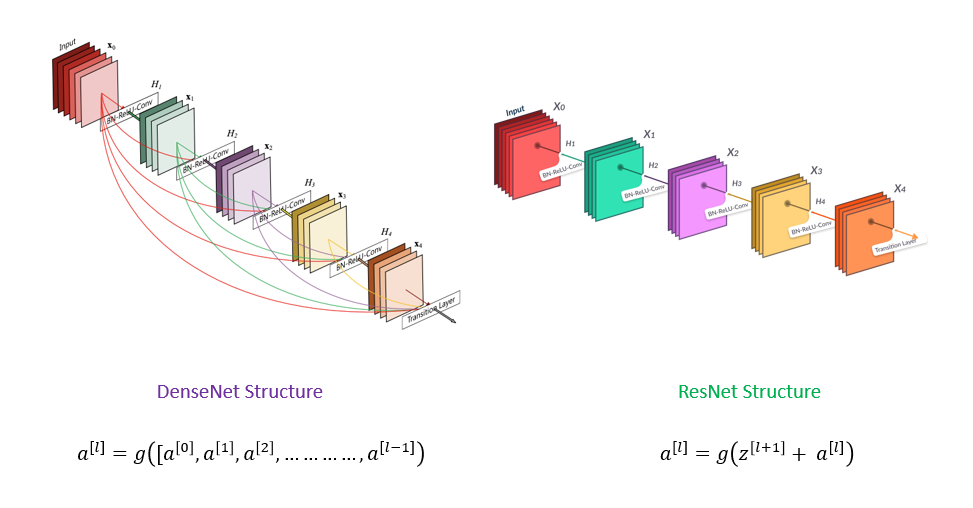

Kreira se model za duboko učenje koji proširuje predefinisani modedl *DenseNet121*, dodajući *dropout* sloj i sloj potpuno povezanih neurona na kraju. Ovako proširen model je spreman za treniranje na prilagođenom skupu podataka.

In [ ]:
from tensorflow.keras.applications import DenseNet121
dense_net = tf.keras.applications.DenseNet121()

dense_net_layer = Dropout(0.5)(dense_net.layers[-2].output)
number_of_classes = len(data_df['class_id'].unique())

last_layer = Dense(number_of_classes, activation="softmax")(dense_net_layer)
model = Model(dense_net.input, last_layer)

model.compile(loss='sparse_categorical_crossentropy',
              optimizer = Adam(0.0001),
              metrics = ['accuracy'])

33188688/33188688 [==============================] - 0s 0us/step


Instanca *ModelChecpoint* *callback*-a će omogućiti automatsko čuvanje modela u fajlu *model.h5* svaki put kada se tačnost modela na validacionom skupu poboljša tokom treniranja.

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(filepath='model.h5', monitor="val_accuracy", save_best_only=True, verbose=1)

*EarlyStopping callback* će pratiti tačnost modela na validacionom skupu tokom treninga i zaustaviti trening ukoliko se tačnost ne poboljša u toku 5 epoha. Takođe *restore_best_weights*  omogućava vraćanje najboljih težina modela, što je korisno kako bi se sačuvala najbolja verzija modela sa najboljim rezultatom na validacionom skupu prije nego što se zaustavi trening.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor = 'val_accuracy', mode='max', patience=5, restore_best_weights = True)

Započinje se trening modela *model* i prati njegov napredak kroz epohe. *Callback* funkcija će omogućiti optimizaciju treninga i zaustavljanje treninga kada se model više ne bude poboljšavao na validacionom skupu.

In [ ]:
hist = model.fit(
    X_train_converted,
    Y_train_converted,
    epochs = 50,
    validation_data = (X_val_converted, Y_val_converted),
    shuffle = True,
    batch_size = 10,
    callbacks= [checkpoint, early_stopping]
)

Epoch 1/50
30/30 [==============================] - ETA: 0s - loss: 4.1231 - accuracy: 0.0473
Epoch 1: val_accuracy improved from -inf to 0.16000, saving model to model.h5
30/30 [==============================] - 264s 7s/step - loss: 4.1231 - accuracy: 0.0473 - val_loss: 3.4330 - val_accuracy: 0.1600
Epoch 2/50
30/30 [==============================] - ETA: 0s - loss: 2.4295 - accuracy: 0.3818
Epoch 2: val_accuracy improved from 0.16000 to 0.33333, saving model to model.h5
30/30 [==============================] - 219s 7s/step - loss: 2.4295 - accuracy: 0.3818 - val_loss: 2.5997 - val_accuracy: 0.3333
Epoch 3/50
30/30 [==============================] - ETA: 0s - loss: 1.4040 - accuracy: 0.6824
Epoch 3: val_accuracy improved from 0.33333 to 0.46667, saving model to model.h5
30/30 [==============================] - 221s 7s/step - loss: 1.4040 - accuracy: 0.6824 - val_loss: 1.9865 - val_accuracy: 0.4667
Epoch 4/50
30/30 [==============================] - ETA: 0s - loss: 0.8375 - accuracy: 0

Za vizualizaciju rezultata treniranja modela tokom epoha koristi se *metplotlib.pyplot*. Prvi dio prikazuje grafik tačnosti modela tokom treninga i validacije, dok drugi dio prikazuje grafik gubitka (*loss*) modela tokom treninga i validacije.

Na prvom grafiku, plava linija predstavlja tačnost na trening skupu, dok narandžasta linija predstavlja tačnost na validacionom skupu. Grafik prikazuje kako se tačnost modela mijenja tokom vremena treninga i kako se ponaša na trening i validacionom skupu. S druge strane, na drugom grafiku, plava linija predstavlja gubitak na trening skupu, dok narandžasta linija predstavlja gubitak na validacionom skupu. Odnosno, drugi grafik prikazuje kako se gubitak modela mijenja tokom vremena treninga i kako se ponaša na trening i validacionom skupu.

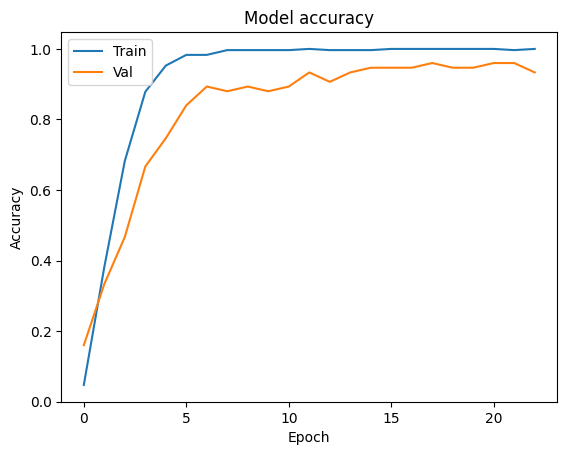

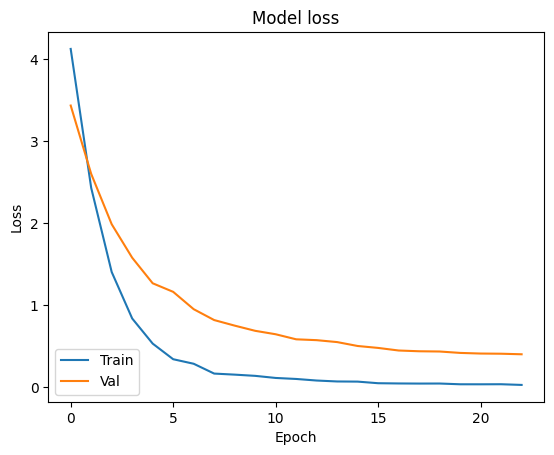

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train','Val'], loc='upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()

Učitava se prethodno sačuvani model koji je obučen na trening podacima. Model se učitava iz fajla *model.h5*, gdje su sačuvane težine i arhitektura modela.

In [ ]:
from tensorflow.keras import models as tf_models

model = tf_models.load_model('model.h5')

Zatim se koristi prethodno učitan model kako bi se klasifikovali uzorci iz testnog skupa podataka. Za svaki uzorak se učitava slika, vrši se preprocesiranje, prikazuje se slika, izvršava se predikcija modelom, a zatim se prikazuje klasa (klasifikacija) koju je model dodjelio uzorku.

1/1 [==============================] - 0s 151ms/step
Class:  32 Minifigure:  JANNAH


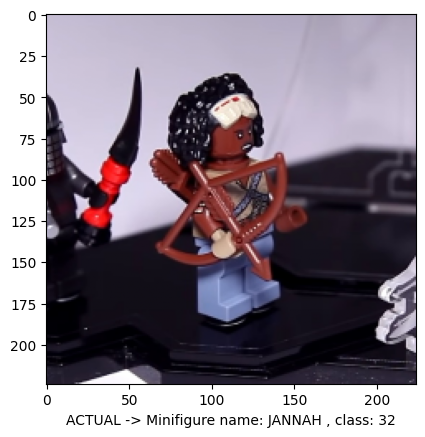

1/1 [==============================] - 0s 180ms/step
Class:  32 Minifigure:  JANNAH


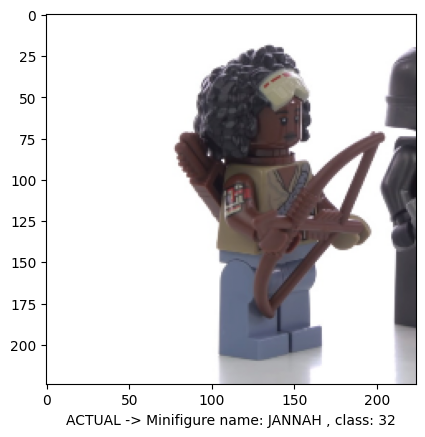

1/1 [==============================] - 0s 193ms/step
Class:  32 Minifigure:  JANNAH


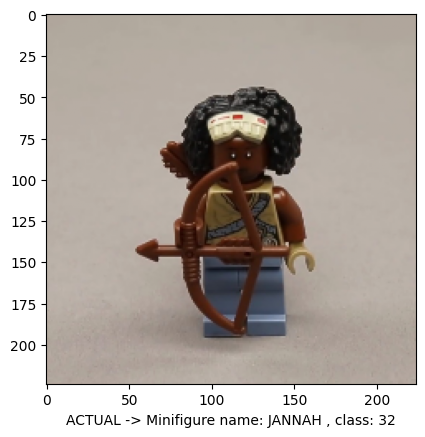

1/1 [==============================] - 0s 165ms/step
Class:  32 Minifigure:  JANNAH


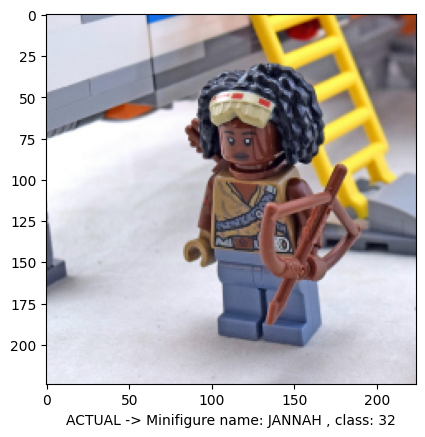

1/1 [==============================] - 0s 181ms/step
Class:  1 Minifigure:  SPIDER-MAN


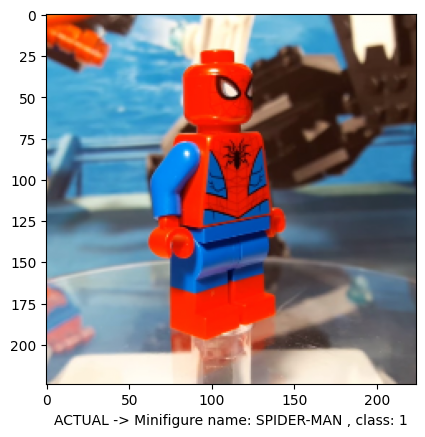

1/1 [==============================] - 0s 172ms/step
Class:  26 Minifigure:  OWEN GRADY


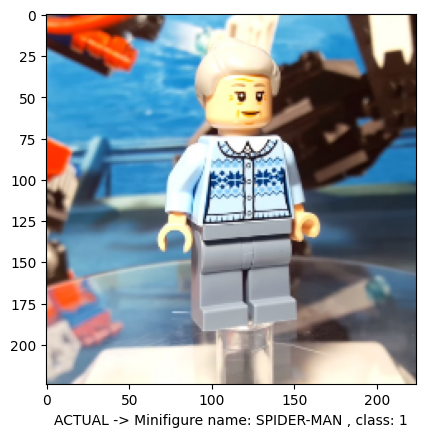

1/1 [==============================] - 0s 160ms/step
Class:  2 Minifigure:  VENOM


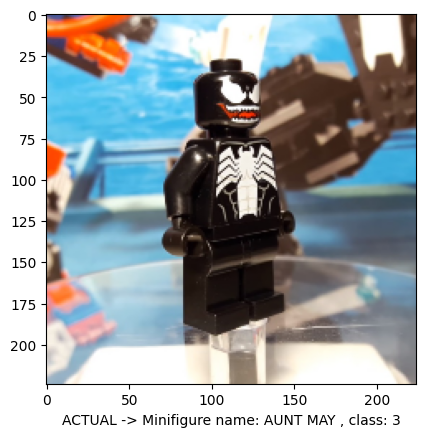

1/1 [==============================] - 0s 155ms/step
Class:  4 Minifigure:  GHOST SPIDER


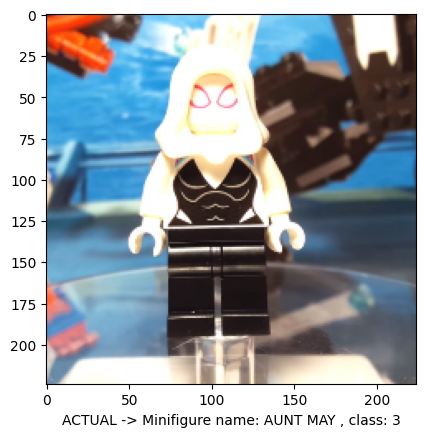

1/1 [==============================] - 0s 162ms/step
Class:  1 Minifigure:  SPIDER-MAN


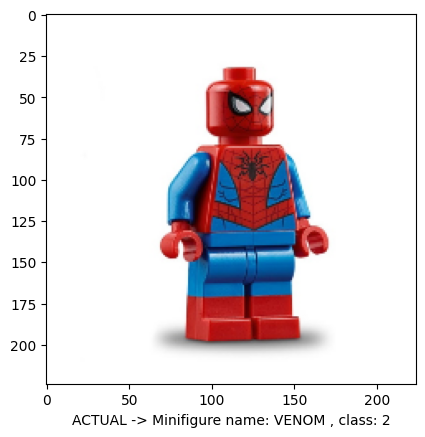

1/1 [==============================] - 0s 268ms/step
Class:  3 Minifigure:  AUNT MAY


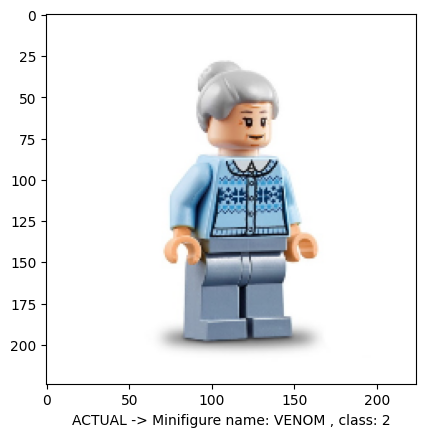

1/1 [==============================] - 0s 285ms/step
Class:  4 Minifigure:  GHOST SPIDER


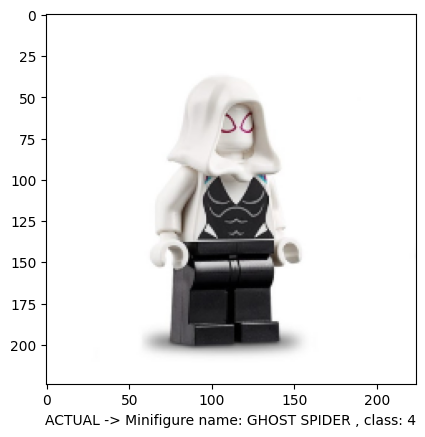

1/1 [==============================] - 0s 273ms/step
Class:  17 Minifigure:  SPIDER-MAN


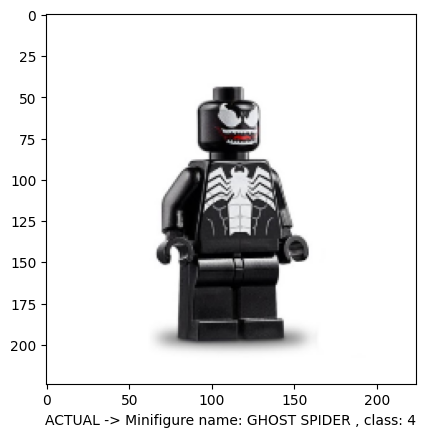

1/1 [==============================] - 0s 278ms/step
Class:  5 Minifigure:  YODA


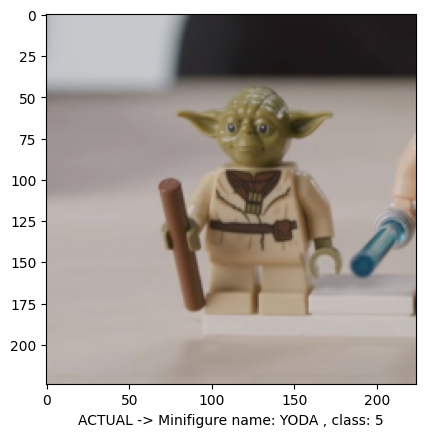

1/1 [==============================] - 0s 152ms/step
Class:  6 Minifigure:  LUKE SKYWALKER


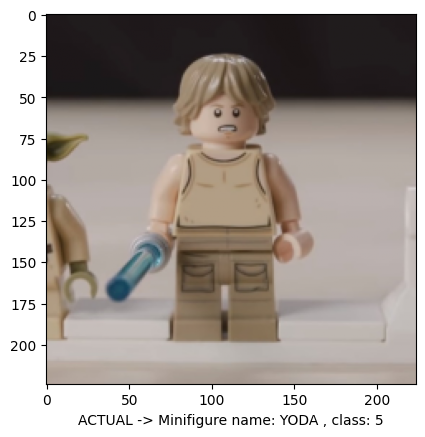

1/1 [==============================] - 0s 165ms/step
Class:  7 Minifigure:  R2-D2


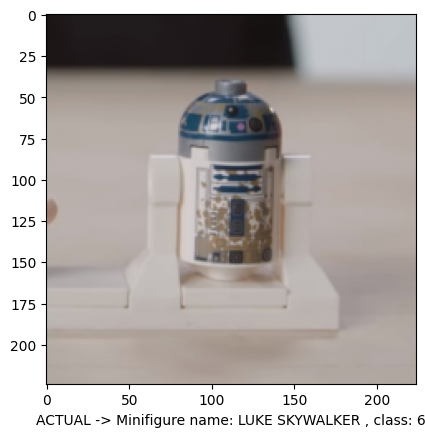

1/1 [==============================] - 0s 170ms/step
Class:  5 Minifigure:  YODA


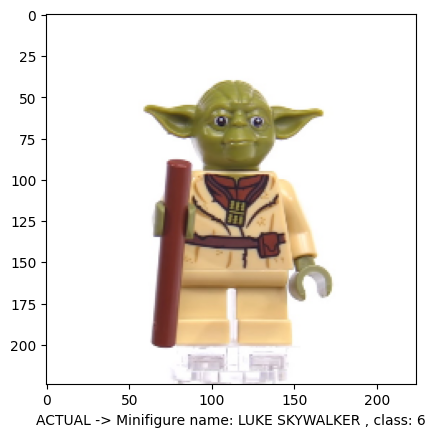

1/1 [==============================] - 0s 164ms/step
Class:  6 Minifigure:  LUKE SKYWALKER


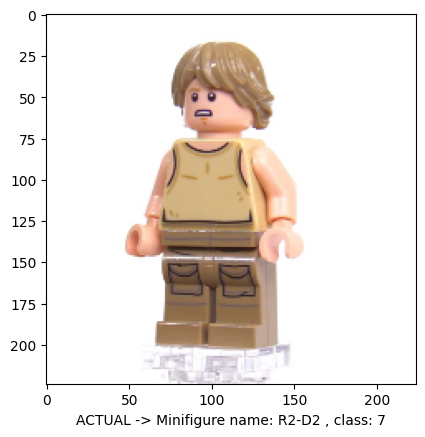

1/1 [==============================] - 0s 160ms/step
Class:  7 Minifigure:  R2-D2


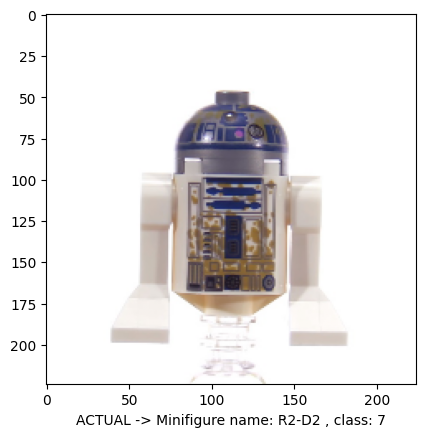

1/1 [==============================] - 0s 158ms/step
Class:  18 Minifigure:  HARRY POTTER


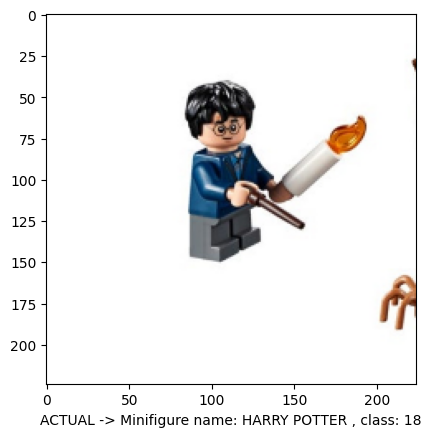

1/1 [==============================] - 0s 174ms/step
Class:  18 Minifigure:  HARRY POTTER


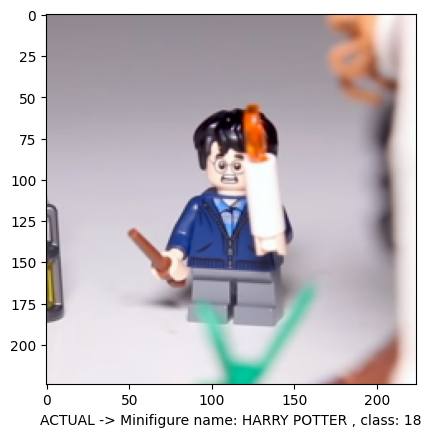

1/1 [==============================] - 0s 168ms/step
Class:  19 Minifigure:  RON WEASLEY


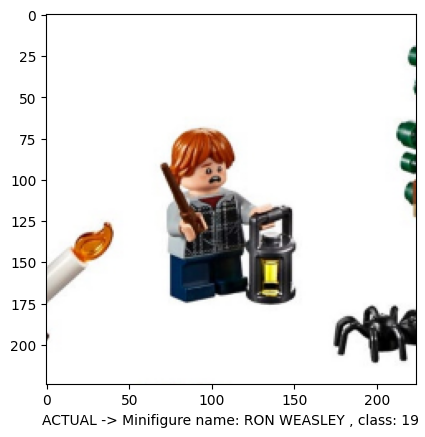

1/1 [==============================] - 0s 168ms/step
Class:  19 Minifigure:  RON WEASLEY


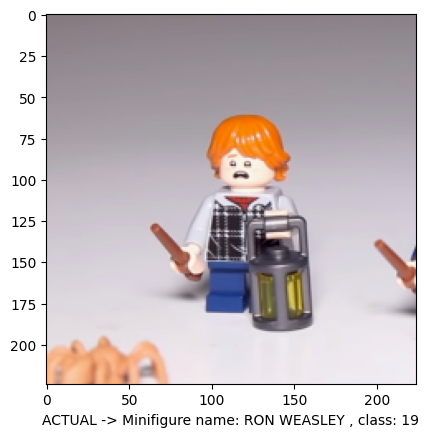

1/1 [==============================] - 0s 168ms/step
Class:  26 Minifigure:  OWEN GRADY


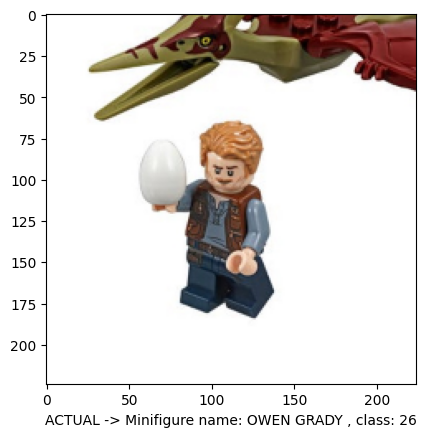

1/1 [==============================] - 0s 162ms/step
Class:  26 Minifigure:  OWEN GRADY


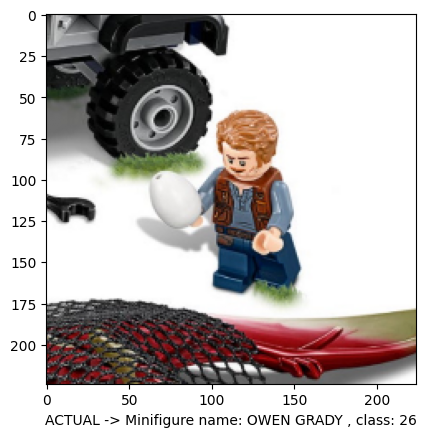

1/1 [==============================] - 0s 170ms/step
Class:  13 Minifigure:  KLATOOINIAN RAIDER 1


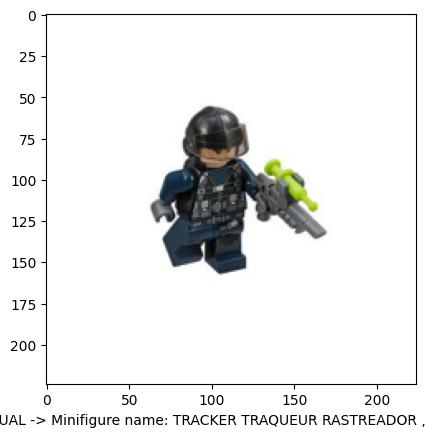

1/1 [==============================] - 0s 170ms/step
Class:  27 Minifigure:  TRACKER TRAQUEUR RASTREADOR


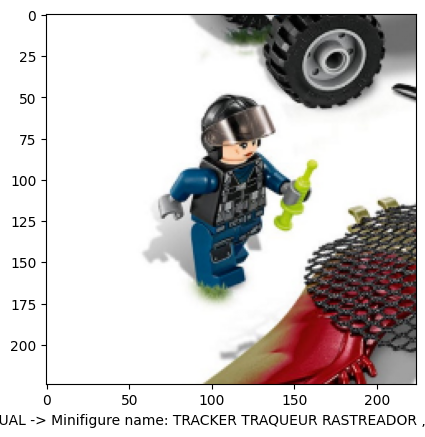

1/1 [==============================] - 0s 165ms/step
Class:  15 Minifigure:  MYSTERIO


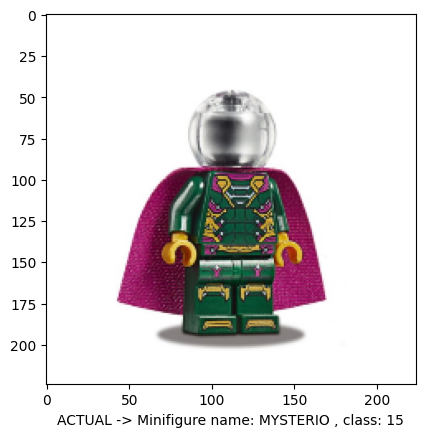

1/1 [==============================] - 0s 173ms/step
Class:  16 Minifigure:  FIREFIGHTER


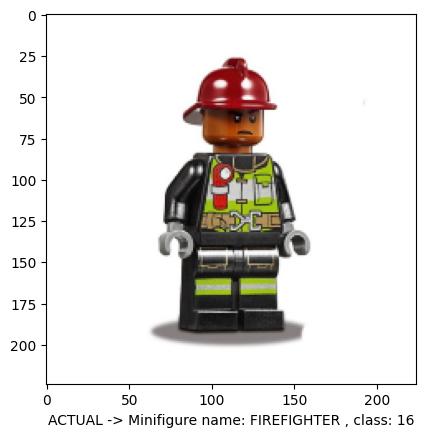

1/1 [==============================] - 0s 273ms/step
Class:  17 Minifigure:  SPIDER-MAN


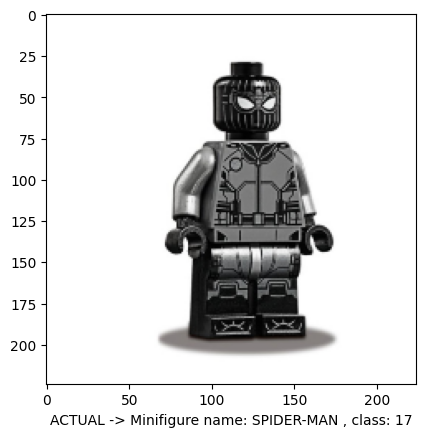

1/1 [==============================] - 0s 312ms/step
Class:  14 Minifigure:  KLATOOINIAN RAIDER 2


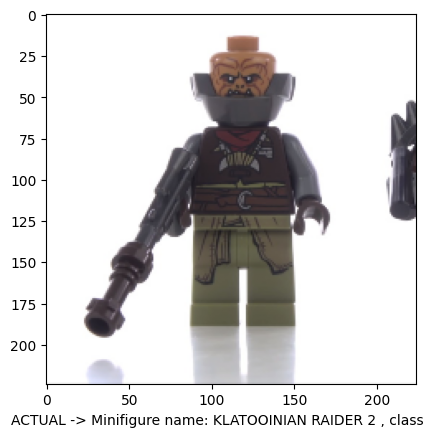

1/1 [==============================] - 0s 282ms/step
Class:  20 Minifigure:  BLACK WIDOW


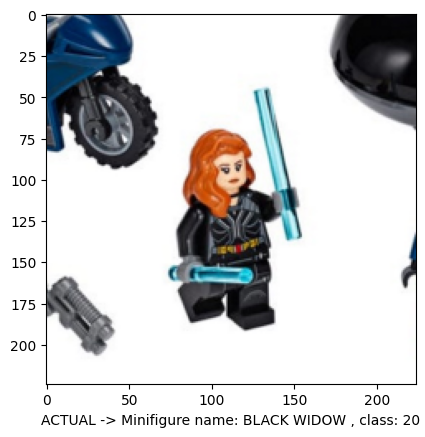

1/1 [==============================] - 0s 283ms/step
Class:  12 Minifigure:  CARA DUNE


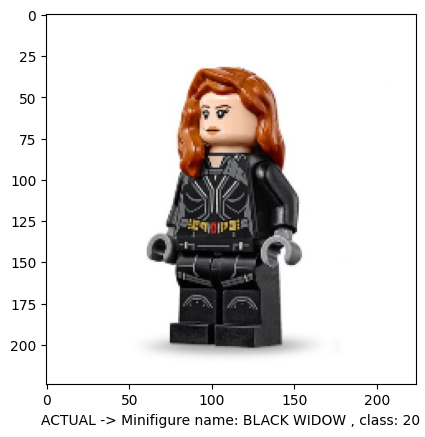

1/1 [==============================] - 0s 168ms/step
Class:  20 Minifigure:  BLACK WIDOW


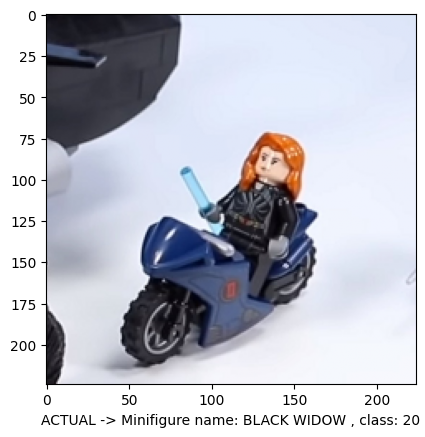

1/1 [==============================] - 0s 159ms/step
Class:  21 Minifigure:  YELENA BELOVA


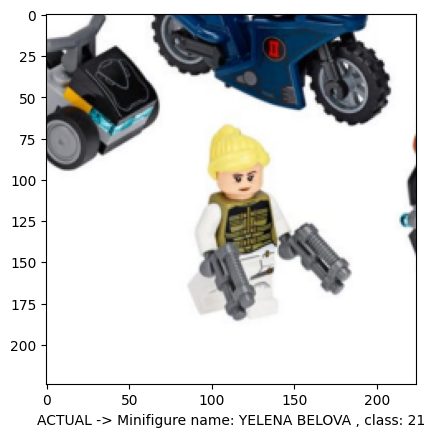

1/1 [==============================] - 0s 161ms/step
Class:  21 Minifigure:  YELENA BELOVA


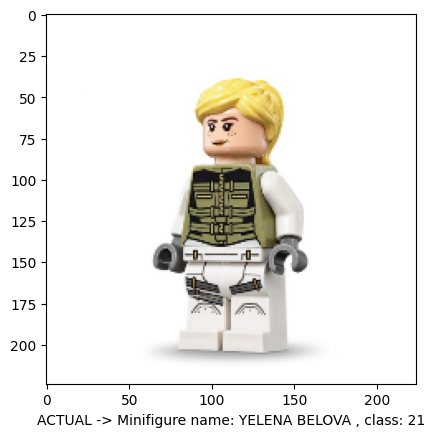

1/1 [==============================] - 0s 169ms/step
Class:  20 Minifigure:  BLACK WIDOW


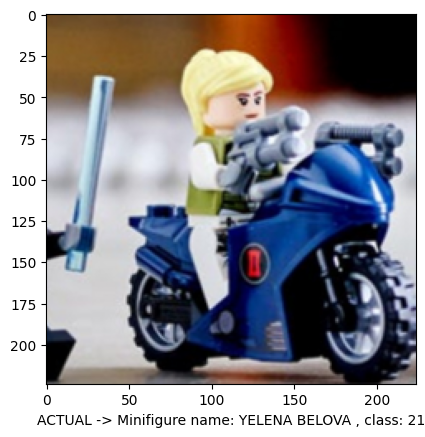

1/1 [==============================] - 0s 165ms/step
Class:  22 Minifigure:  TASKMASTER


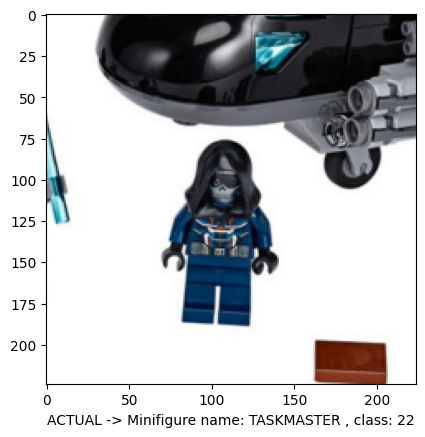

1/1 [==============================] - 0s 167ms/step
Class:  22 Minifigure:  TASKMASTER


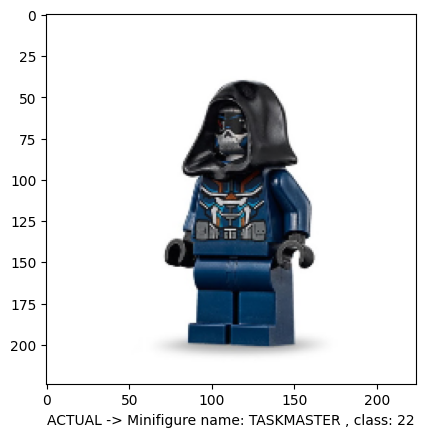

1/1 [==============================] - 0s 180ms/step
Class:  22 Minifigure:  TASKMASTER


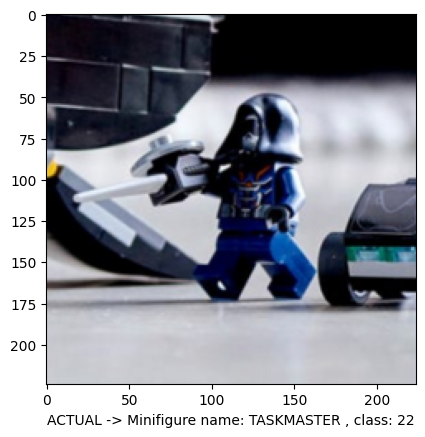

1/1 [==============================] - 0s 192ms/step
Class:  23 Minifigure:  CAPTAIN AMERICA


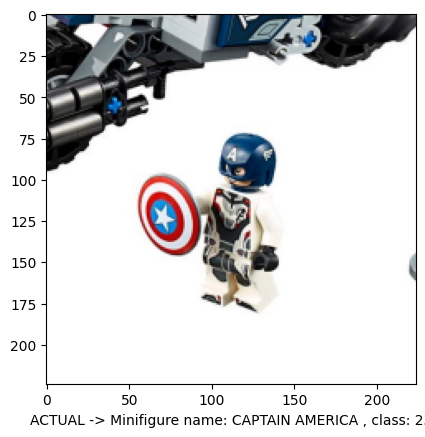

1/1 [==============================] - 0s 186ms/step
Class:  23 Minifigure:  CAPTAIN AMERICA


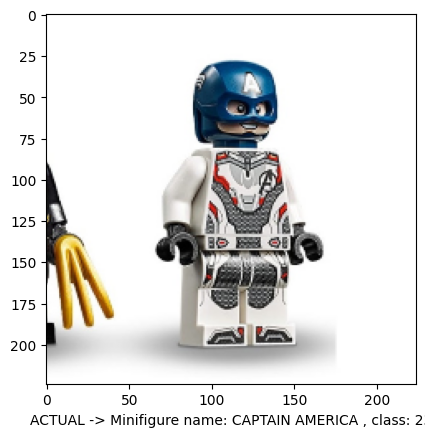

1/1 [==============================] - 0s 183ms/step
Class:  24 Minifigure:  OUTRIDER 1


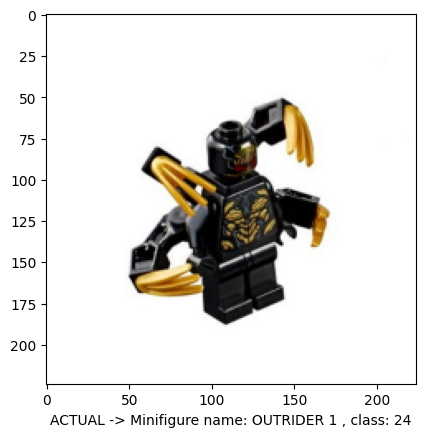

1/1 [==============================] - 0s 185ms/step
Class:  24 Minifigure:  OUTRIDER 1


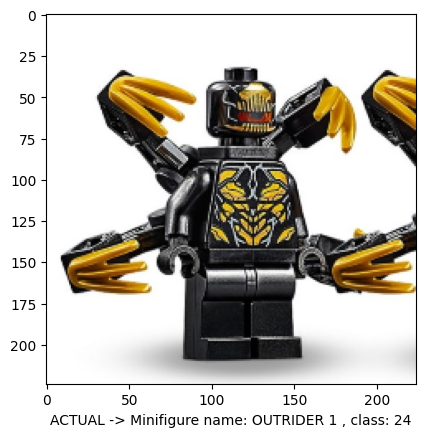

1/1 [==============================] - 0s 183ms/step
Class:  24 Minifigure:  OUTRIDER 1


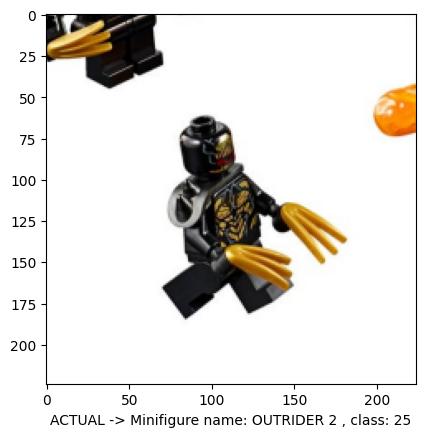

1/1 [==============================] - 0s 168ms/step
Class:  25 Minifigure:  OUTRIDER 2


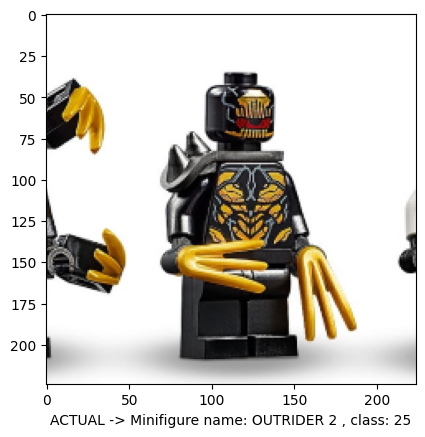

1/1 [==============================] - 0s 199ms/step
Class:  31 Minifigure:  IRON MAN MK 50


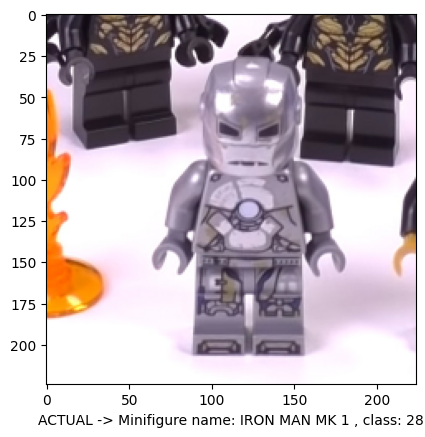

1/1 [==============================] - 0s 207ms/step
Class:  28 Minifigure:  IRON MAN MK 1


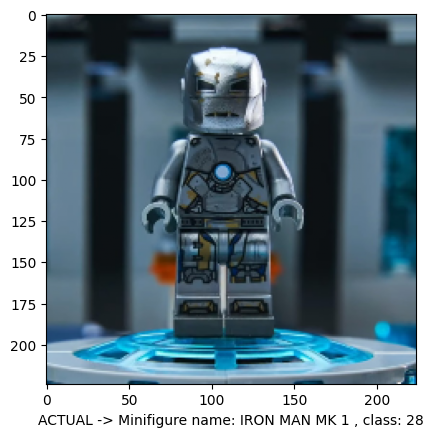

1/1 [==============================] - 0s 242ms/step
Class:  29 Minifigure:  IRON MAN MK 5


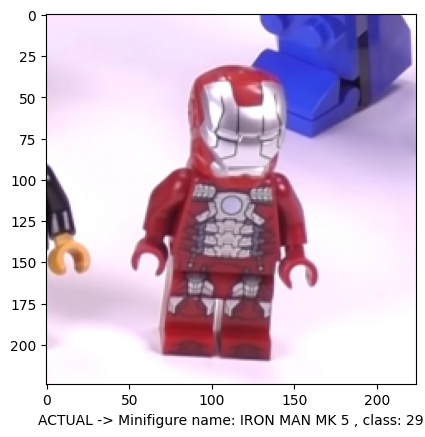

1/1 [==============================] - 0s 272ms/step
Class:  29 Minifigure:  IRON MAN MK 5


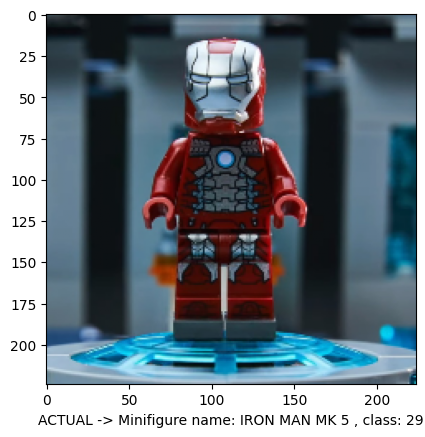

1/1 [==============================] - 0s 276ms/step
Class:  30 Minifigure:  IRON MAN MK 41


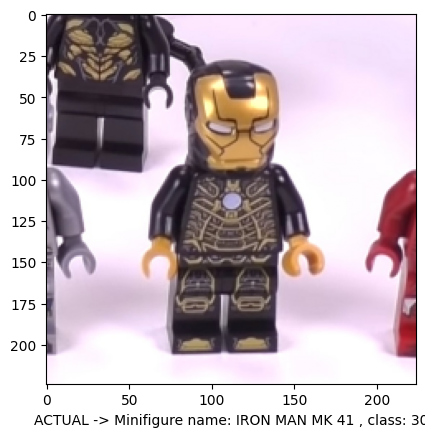

1/1 [==============================] - 0s 320ms/step
Class:  30 Minifigure:  IRON MAN MK 41


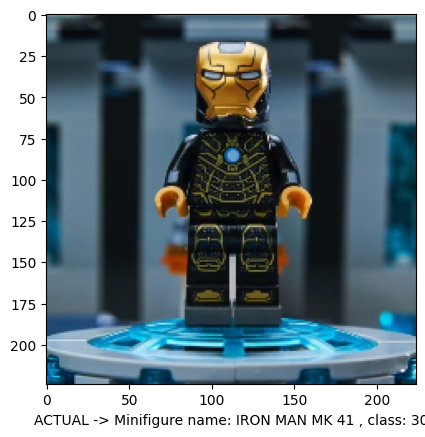

1/1 [==============================] - 0s 324ms/step
Class:  31 Minifigure:  IRON MAN MK 50


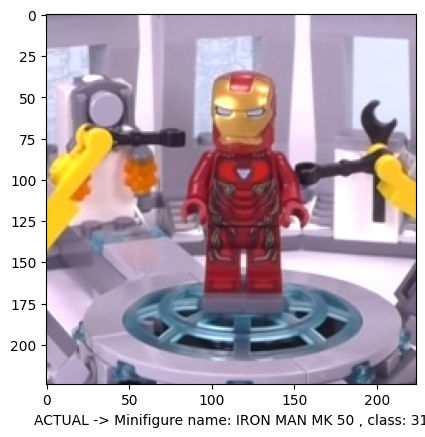

1/1 [==============================] - 0s 279ms/step
Class:  31 Minifigure:  IRON MAN MK 50


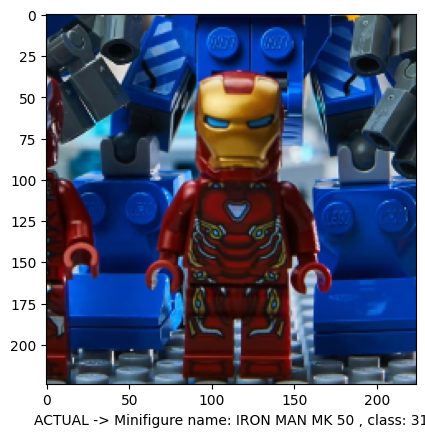

1/1 [==============================] - 0s 207ms/step
Class:  8 Minifigure:  MACE WINDU


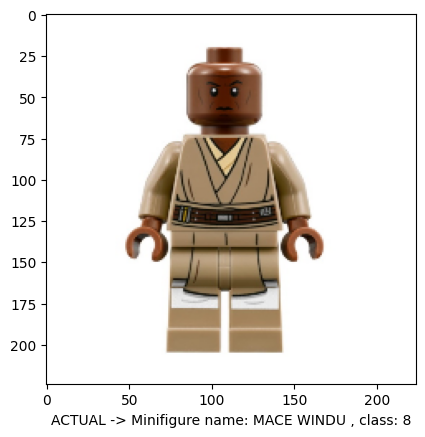

1/1 [==============================] - 0s 223ms/step
Class:  8 Minifigure:  MACE WINDU


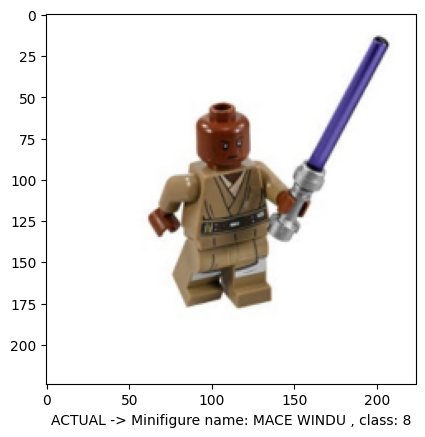

1/1 [==============================] - 0s 184ms/step
Class:  9 Minifigure:  GENERAL GRIEVOUS


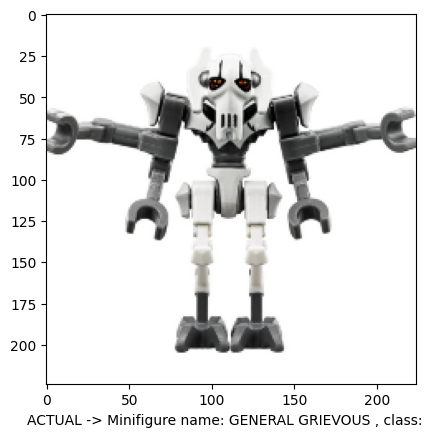

1/1 [==============================] - 0s 201ms/step
Class:  9 Minifigure:  GENERAL GRIEVOUS


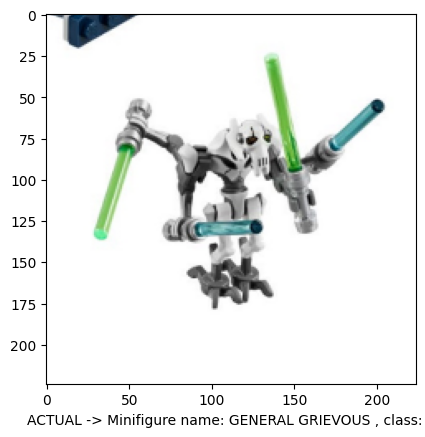

1/1 [==============================] - 0s 178ms/step
Class:  10 Minifigure:  KYLO REN


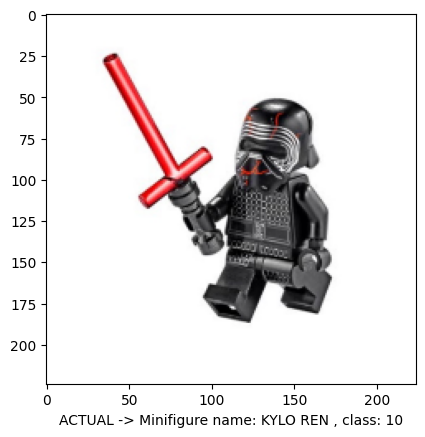

1/1 [==============================] - 0s 198ms/step
Class:  10 Minifigure:  KYLO REN


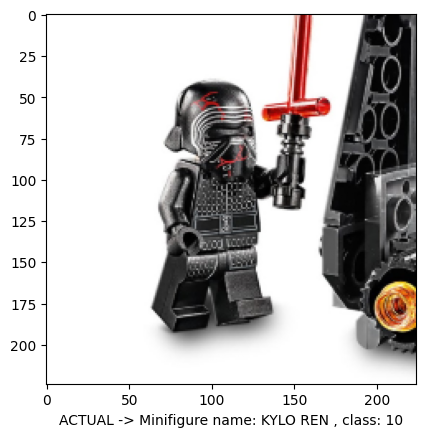

1/1 [==============================] - 0s 190ms/step
Class:  11 Minifigure:  THE MANDALORIAN


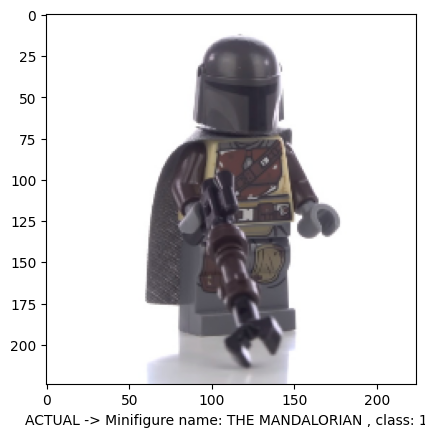

1/1 [==============================] - 0s 195ms/step
Class:  12 Minifigure:  CARA DUNE


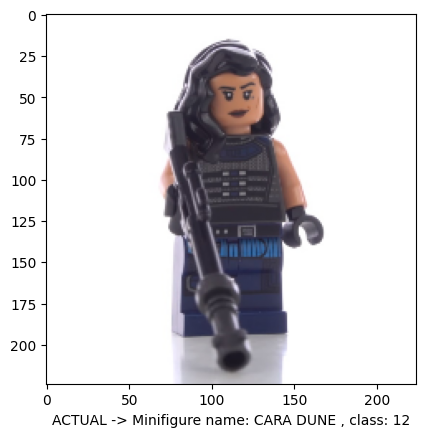

1/1 [==============================] - 0s 198ms/step
Class:  13 Minifigure:  KLATOOINIAN RAIDER 1


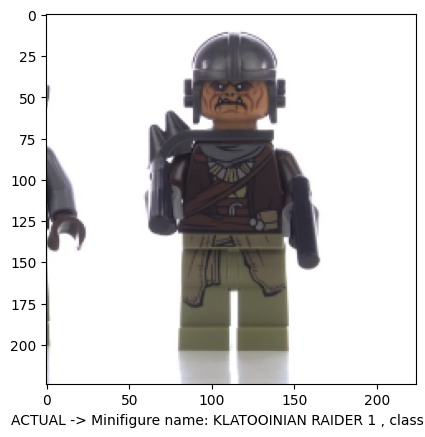

1/1 [==============================] - 0s 178ms/step
Class:  37 Minifigure:  OBI-WAN KENOBI


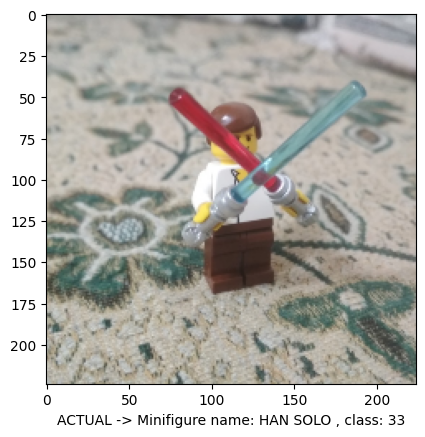

1/1 [==============================] - 0s 197ms/step
Class:  33 Minifigure:  HAN SOLO


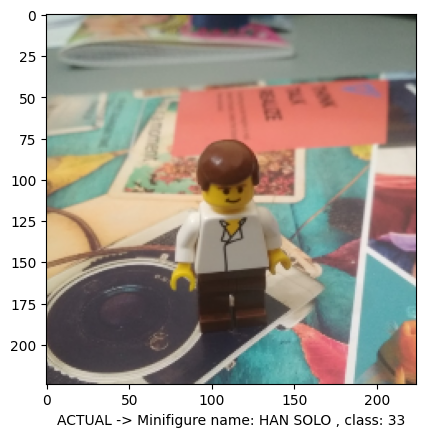

1/1 [==============================] - 0s 223ms/step
Class:  34 Minifigure:  DARTH VADER


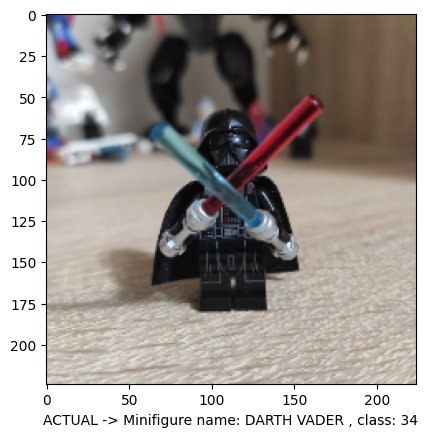

1/1 [==============================] - 0s 222ms/step
Class:  36 Minifigure:  EMPEROR PALPATINE


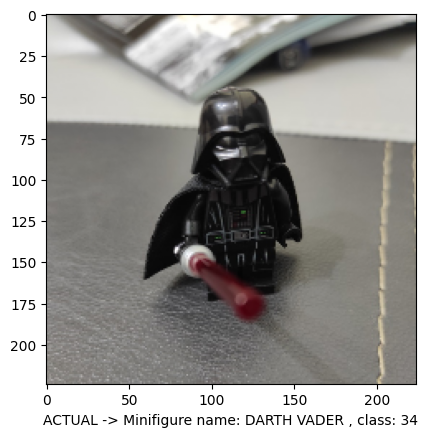

1/1 [==============================] - 0s 272ms/step
Class:  34 Minifigure:  DARTH VADER


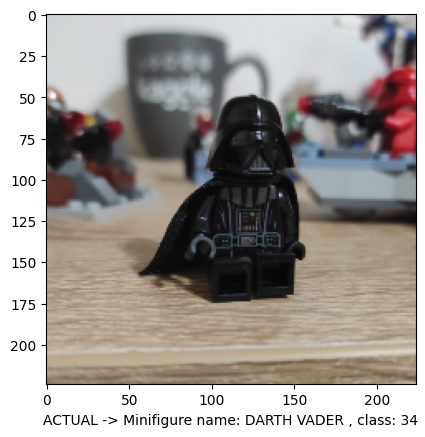

1/1 [==============================] - 0s 271ms/step
Class:  34 Minifigure:  DARTH VADER


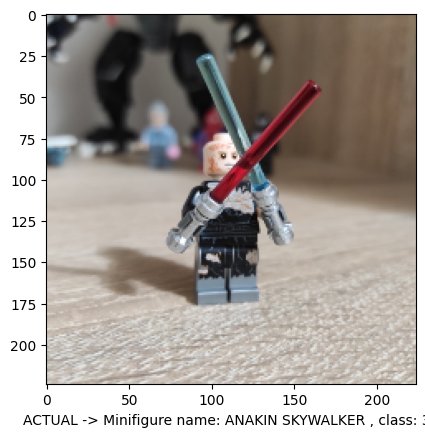

1/1 [==============================] - 0s 332ms/step
Class:  35 Minifigure:  ANAKIN SKYWALKER


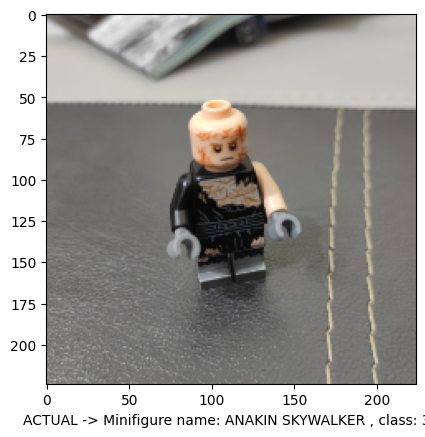

1/1 [==============================] - 0s 267ms/step
Class:  35 Minifigure:  ANAKIN SKYWALKER


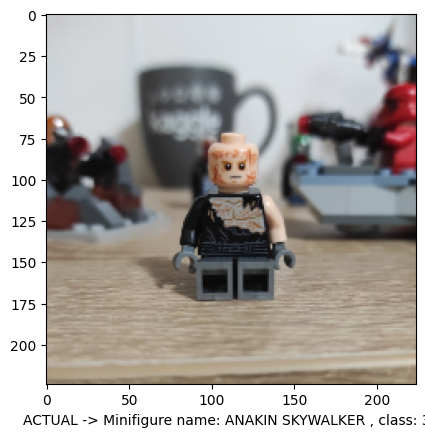

1/1 [==============================] - 0s 338ms/step
Class:  36 Minifigure:  EMPEROR PALPATINE


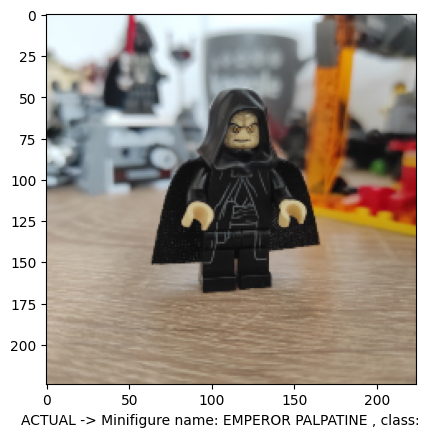

1/1 [==============================] - 0s 281ms/step
Class:  36 Minifigure:  EMPEROR PALPATINE


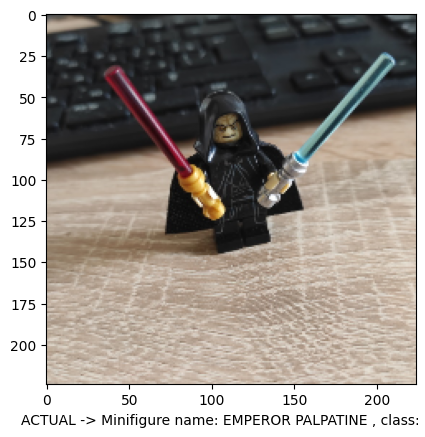

1/1 [==============================] - 0s 268ms/step
Class:  36 Minifigure:  EMPEROR PALPATINE


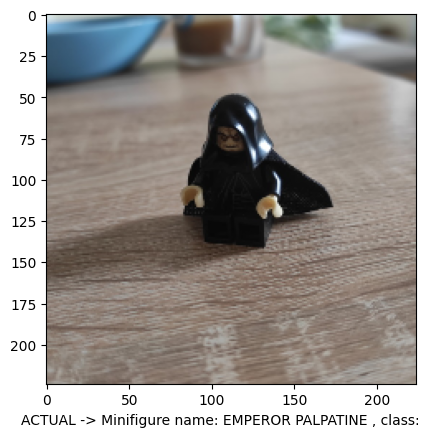

1/1 [==============================] - 0s 268ms/step
Class:  37 Minifigure:  OBI-WAN KENOBI


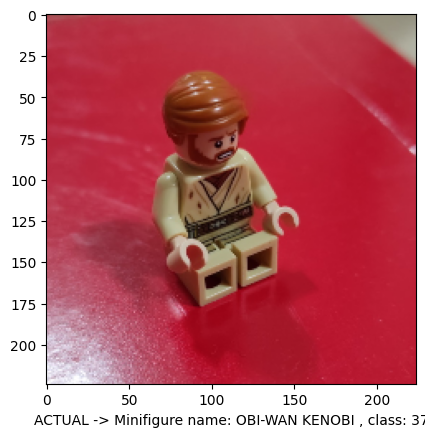

1/1 [==============================] - 0s 275ms/step
Class:  37 Minifigure:  OBI-WAN KENOBI


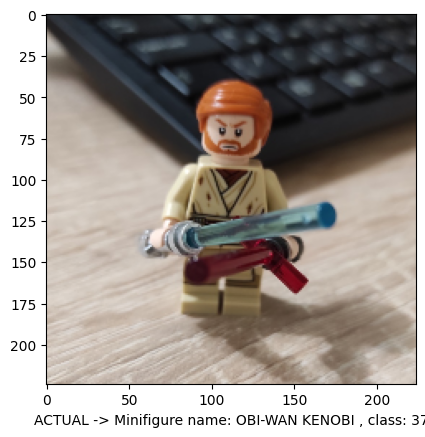

1/1 [==============================] - 0s 255ms/step
Class:  37 Minifigure:  OBI-WAN KENOBI


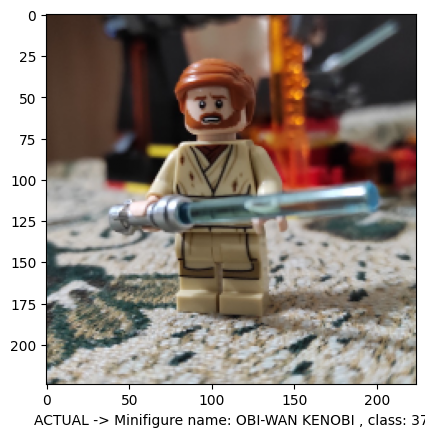

1/1 [==============================] - 0s 285ms/step
Class:  38 Minifigure:  BOBA FETT


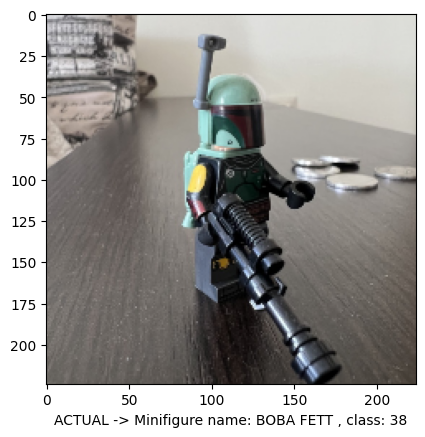

1/1 [==============================] - 0s 277ms/step
Class:  38 Minifigure:  BOBA FETT


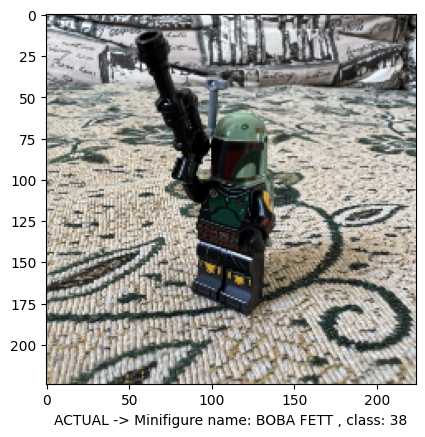

1/1 [==============================] - 0s 267ms/step
Class:  38 Minifigure:  BOBA FETT


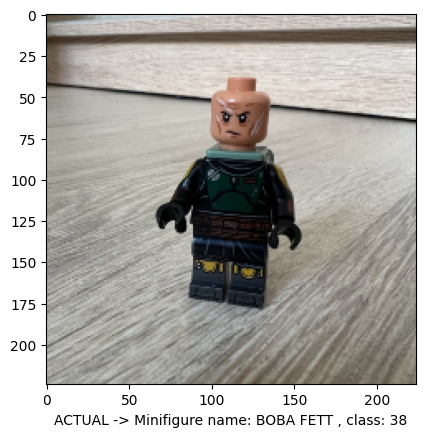

In [ ]:
for i in range(len(test_df)):

  image = cv2.imread(X_test['path'].values[i])
  image = cv2.resize(image, dsize=(224, 224))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)/255
  plt.imshow(image)
  plt.xlabel('ACTUAL -> Minifigure name: ' + test_actual_df['minifigure_name'].values[i]+ ' , class: ' + str(test_actual_df['class_id'].values[i]))
  image = np.reshape(image, (1, 224, 224, 3))
  ans = model.predict(image).argmax()
  ans = ans+1
  minifigure = metadata_df["minifigure_name"][metadata_df["class_id"] == ans].iloc[0]
  print("Class: ", str(ans) + " Minifigure: ", minifigure)
  plt.show()

Prikazuju se rezultati evaluacije modela na validacionom skupu podataka. Gubitak (*loss*) mjeri koliko su tačne predikcije modela u odnosu na stvarne vrijednosti, dok tačnost (*accuracy*) predstavlja procenat tačno klasifikovanih uzoraka. Ovi rezultati pomažu u procjeni performansi modela na validacionom skupu i omogućavaju uvid u to koliko dobro se model generalizuje na novim podacima.


In [ ]:
loss, accuracy = model.evaluate(X_val_converted, Y_val_converted, verbose=1)

print('Test loss: ', loss)
print('Test accuracy: ', accuracy)

3/3 [==============================] - 11s 3s/step - loss: 0.4378 - accuracy: 0.9600
Test loss:  0.4378425180912018
Test accuracy:  0.9599999785423279


# **ResNet50**

**ResNet50** je konvoluciona neuronska mreža duboka 50 slojeva. ResNet, skraćenica za *Residual Network* je klasična neuronska mreža koja se koristi kao okosnica za mnoge zadatke računarske vizije. ResNet omogućava treniranje izuzetno duboke neuronske mreže sa 150+ slojeva.

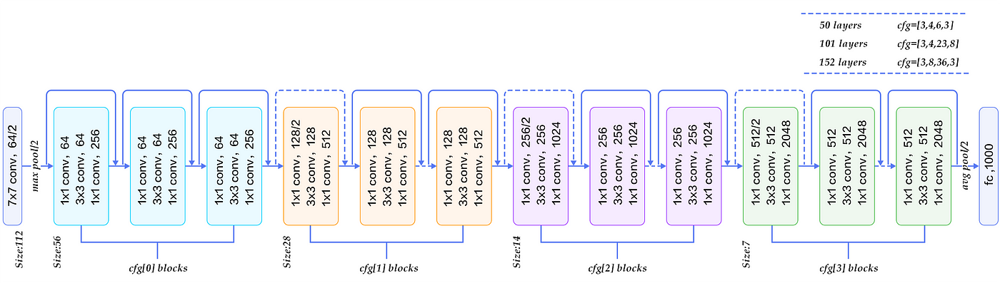

Definiše se novi model koji koristi prethodno obučeni model ResNet50 kao osnovu, a zatim dodaje nekoliko novih slojeva za potrebe *fine*-tjuninga i klasifikacije.

In [ ]:
model3 = Sequential()

pretrained_model = tf.keras.applications.ResNet50(include_top=False,
                                                  weights = 'imagenet',
                                                  input_shape = (224, 224, 3),
                                                  pooling = 'avg')

for layer in pretrained_model.layers:
  layer.trainable = False

model3.add(pretrained_model)
model3.add(tf.keras.layers.BatchNormalization())
model3.add(tf.keras.layers.Flatten())
model3.add(tf.keras.layers.Dense(512, activation = 'relu'))
model3.add(tf.keras.layers.Dense(number_of_classes, activation='softmax'))

model3.summary()



94765736/94765736 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 batch_normalization (BatchN  (None, 2048)             8192      
 ormalization)                                                   
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               1049088   
                                                                 
 dense_2 (Dense)             (None, 38)                19494     
                                                                 
Total params: 24,664,486
Trainable params: 1,072,678
Non-

Koristi se funkcija *compile()* kako bi se postavili parametri za kompajliranje modela. Kompilacija modela je neophodan korak prije treniranja modela.

In [ ]:
model3.compile(
    optimizer = Adam(0.0001),
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

Definišu se dva različita *callback*-a - *early_stopping* i *learning_rate_reduction*, koji se koriste tokom treninga modela. Ova dva *callback*-a se koriste tokom treninga modela kako bi se prilagodili parametri treninga i osiguralo da trening bude efikasan i optimizovan. Uz *early stopping*, treniranje će biti zaustavljeno kada model prestane da poboljšava performanse na validacionom skupu. A uz smanjenje stope učenja, optimizacija će biti stabilnija i efikasnija.

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

early_stopping = EarlyStopping(monitor = 'val_loss', mode = 'max', patience = 5, restore_best_weights=True)

learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(monitor = "accuracy", factor=0.5, patience=3, verbose=0, min_lr=0.0001)
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, verbose=1)


In [ ]:
hist = model3.fit(X_train_converted, Y_train_converted, validation_data=(X_val_converted, Y_val_converted), batch_size= 10, epochs=100, callbacks=[checkpoint, early_stopping, learning_rate_reduction])

Epoch 1/100
30/30 [==============================] - ETA: 0s - loss: 3.6979 - accuracy: 0.0304
Epoch 1: val_accuracy did not improve from 0.96000
30/30 [==============================] - 71s 2s/step - loss: 3.6979 - accuracy: 0.0304 - val_loss: 3.7726 - val_accuracy: 0.0133 - lr: 1.0000e-04
Epoch 2/100
30/30 [==============================] - ETA: 0s - loss: 3.3163 - accuracy: 0.1250
Epoch 2: val_accuracy did not improve from 0.96000
30/30 [==============================] - 67s 2s/step - loss: 3.3163 - accuracy: 0.1250 - val_loss: 3.7102 - val_accuracy: 0.0133 - lr: 1.0000e-04
Epoch 3/100
30/30 [==============================] - ETA: 0s - loss: 3.0523 - accuracy: 0.2297
Epoch 3: val_accuracy did not improve from 0.96000
30/30 [==============================] - 65s 2s/step - loss: 3.0523 - accuracy: 0.2297 - val_loss: 3.6486 - val_accuracy: 0.0133 - lr: 1.0000e-04
Epoch 4/100
30/30 [==============================] - ETA: 0s - loss: 2.8977 - accuracy: 0.2905
Epoch 4: val_accuracy did not

Prikazuju se dva grafika. Prvi grafik prikazuje kako se tačnost modela na trening skupu mijenja tokom svake epohe, dok drugi grafik prikazuje kako se tačnost modela na validacionom skupu mijenja tokom svake epohe. Na osnovu ovih grafika može se vidjeti kako se model ponašao tokom treninga i kako su mu performanse na treningu i validaciji evoluirale tokom vremena.

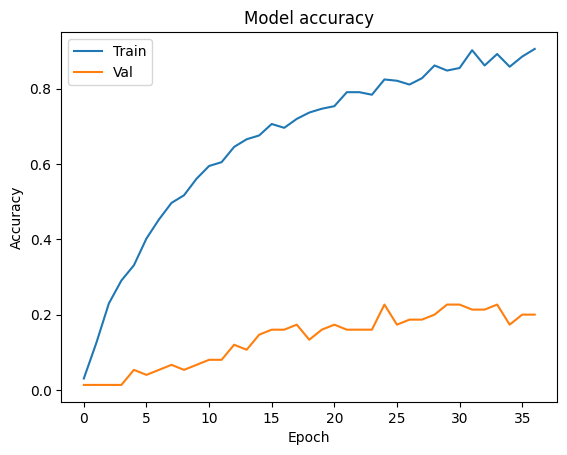

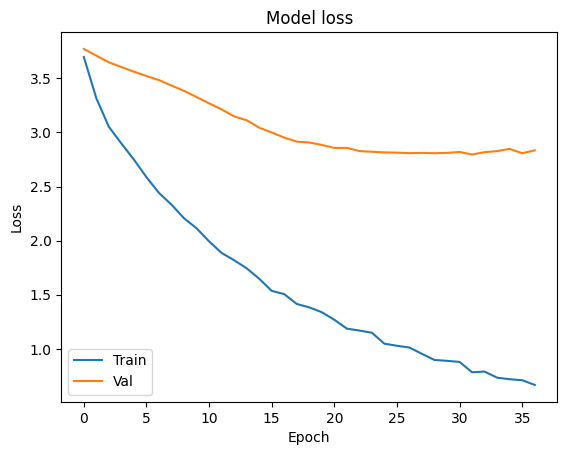

In [ ]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc = 'upper left')
plt.show()

plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='lower left')
plt.show()


Na kraju se prikazuju rezultati evaluacije modela na validacionom skupu podataka. Gubitak (*loss*) mjeri koliko su tačne predikcije modela u odnosu na stvarne vrijednosti, dok tačnost (*accuracy*) predstavlja procenat tačno klasifikovanih uzoraka. Ovi rezultati pomažu u procjeni performansi modela na validacionom skupu i daju uvid u to koliko dobro se model generalizuje na stvarnim podacima.

In [ ]:
loss, accuracy = model3.evaluate(X_val_converted, Y_val_converted, verbose=1)

print('Test loss: ', loss)
print('Test accuracy: ', accuracy)

3/3 [==============================] - 12s 3s/step - loss: 2.8348 - accuracy: 0.2000
Test loss:  2.834841012954712
Test accuracy:  0.20000000298023224


# **ZAKLJUČAK**

U okviru projektnog zadatka izvršeno je učitavanje i analiza podataka, kao i podjela podataka na podatke za trening, validaciju i test. Pored toga, izvršeno je kreiranje modela DenseNet121 i ResNet50, kao i treniranje navedenih modela i evaluacija modela. Pri istraživanju modela za klasifikaciju datih podataka DenseNet121 se istakao po efikasnosti, preciznosti i sposobnosti da nauči specifične karakteristike slika. Rezultati koji su dobijeni pomoću ResNet50 bi sigurno bili bolji da je broj epoha povećan, odnosno da je trening produžen. Ali na osnovu ovoga možemo zaključiti da je DenseNet121 svakako bolji u odnosu na ResNet50, jer on daje bolje rezultate i sa manjim brojem epoha.

# **REFERENCE**



1.   NumPy (https://numpy.org/devdocs/user/whatisnumpy.html)
2.   Pandas (https://pandas.pydata.org/docs/getting_started/overview.html)
3.   Seaborn (https://seaborn.pydata.org/tutorial/introduction)
4.   Machine Learning (https://machinelearningmastery.com/introduction-python-deep-learning-library-tensorflow/)
5.   Classification in Machine Learning (https://www.simplilearn.com/tutorials/machine-learning-tutorial/classification-in-machine-learning)
6.   Supervised Learning (https://www.superannotate.com/blog/supervised-learning-and-other-machine-learning-tasks#what-is-machine-learning-in-general)
7.   DenseNet (https://www.analyticsvidhya.com/blog/2022/03/introduction-to-densenets-dense-cnn/)
8. ResNet (https://datagen.tech/guides/computer-vision/resnet-50/)

